## 프로젝트 수행
프로젝트를 진행하면서 필수로 수행해야 할 사항은 다음과 같습니다.

1. 데이터에 한 가지 이상의 `augmentation 방법을 적용`하여 학습해주세요. \
(어떠한 방법을 사용했는지 적어주세요.)
2. 이전에 구현했던 두 개의 Generator 중 Encoder와 Decoder간에 skip connection이 있는 `U-Net Generator`를 사용해주세요.
3. 모델 학습 후, 학습된 Generator를 이용해 테스트합니다. 테스트 데이터는 다운받았던 "val" 폴더 내 이미지를 사용해주세요.
4. 1개 이상의 이미지에 대해 테스트 과정을 거친 후 그 결과를 **스케치, 생성된 사진, 실제 사진 순서로 나란히 시각화**해 주세요.
5. 모델을 충분히 학습하기에 시간이 부족할 수 있습니다. 적어도 10 epoch 이상 학습하며 **중간 손실 값에 대한 로그**를 남겨주세요. 좋은 결과를 얻기 위해선 긴 학습 시간이 필요하므로 테스트 결과는 만족스럽지 않아도 괜찮습니다.

In [1]:
# 변수 모음 - 학습관련을 제외하고는 노드와 같은 상태

# 데이터셋 구성 관련
BUFFER_SIZE = 1000              # 전체 데이터 셋 크기만큼 설정
BATCH_SIZE = 10                  # 한번에 학습할 데이터의 양

# 모델 구성 관련
DROPOUT = 0.5                   # Generator
ALPHA = 0.2                     # LeakyReLU(0.3)
MOMENTUM = 0.99                 # BatchNormalization(0.99)
G_init, D_init = 2e-4, 2e-3     # Adam(1e-3)
BETA_1, BETA_2 = 0.5, 0.999     # beta: 이전 결과가 영향을 주는 정도 (0.9, 0.999)
DECAY = 1e-5                    # decay: 업데이트마다 적용되는 학습률의 감소율

# 학습 관련
save_every = 50                 # 
EPOCHS = 400                    # 학습횟수

배치사이즈를 늘리고 decay 적용하고

이전에 했던 것 처럼 판별자를 상대적으로 멍청하게 만들었다!

# 데이터 준비하기

In [2]:
import os

data_path = os.getenv('HOME')+'/aiffel/cGAN/cityscapes/train/'
print("number of train examples :", len(os.listdir(data_path)))

number of train examples : 1000


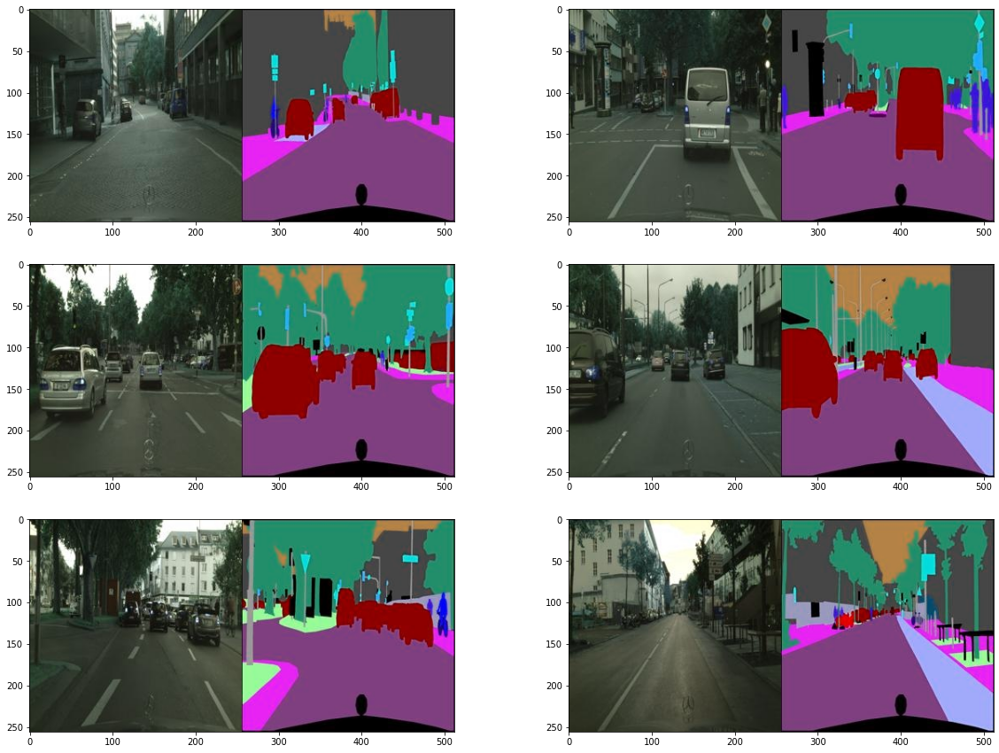

In [3]:
# 시각화

import cv2
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(20,15))
for i in range(1, 7):
    f = data_path + os.listdir(data_path)[np.random.randint(1000)]
    img = cv2.imread(f, cv2.IMREAD_COLOR)
    plt.subplot(3,2,i)
    plt.imshow(img)

In [4]:
# 이미지 크기 확인

f = data_path + os.listdir(data_path)[0]
img = cv2.imread(f, cv2.IMREAD_COLOR)
print(img.shape)

(256, 512, 3)


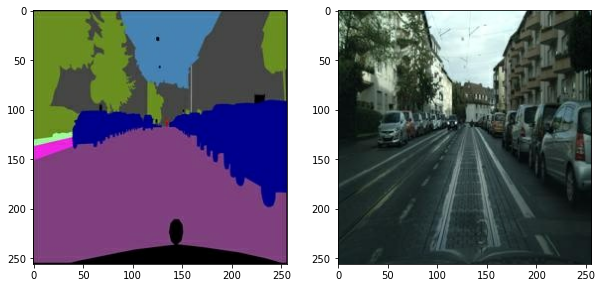

In [5]:
# 이미지 분할

import tensorflow as tf

def normalize(x):
    x = tf.cast(x, tf.float32)
    return (x/127.5) - 1

def denormalize(x):
    x = (x+1)*127.5
    x = x.numpy()
    return x.astype(np.uint8)

def load_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, 3)
    
    w = tf.shape(img)[1] // 2
    real_img = img[:, :w, :] 
    real_img = tf.cast(real_img, tf.float32)
    seg = img[:, w:, :] 
    seg = tf.cast(seg, tf.float32)
    return normalize(seg), normalize(real_img)

f = data_path + os.listdir(data_path)[1]
seg, real_img = load_img(f)

plt.figure(figsize=(10,7))
plt.subplot(1,2,1); plt.imshow(denormalize(seg))
plt.subplot(1,2,2); plt.imshow(denormalize(real_img))

In [6]:
# agumentation
# 단일색 padding 대신 주변의 값으로 padding
# 도로이므로 상하대칭과 회전은 제외

from tensorflow import image
from tensorflow.keras.preprocessing.image import random_rotation

@tf.function() # 빠른 텐서플로 연산을 위해 @tf.function()을 사용합니다. 
def apply_augmentation(seg, real_img):
    stacked = tf.concat([seg, real_img], axis=-1)     # image concat
    
    _pad = tf.constant([[30,30],[30,30],[0,0]])         # padding
    if tf.random.uniform(()) < .5:
        padded = tf.pad(stacked, _pad, "REFLECT")
    else:
        padded = tf.pad(stacked, _pad, "SYMMETRIC")     # CONSTANT 대신 SYMMETRIC 적용

    out = image.random_crop(padded, size=[256, 256, 6]) # resizing
    
    out = image.random_flip_left_right(out)             # flip
    # out = image.random_flip_up_down(out)
    
    #if tf.random.uniform(()) < .5:
        #degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)
        #out = image.rot90(out, k=degree)
    
    return out[...,:3], out[...,3:]   

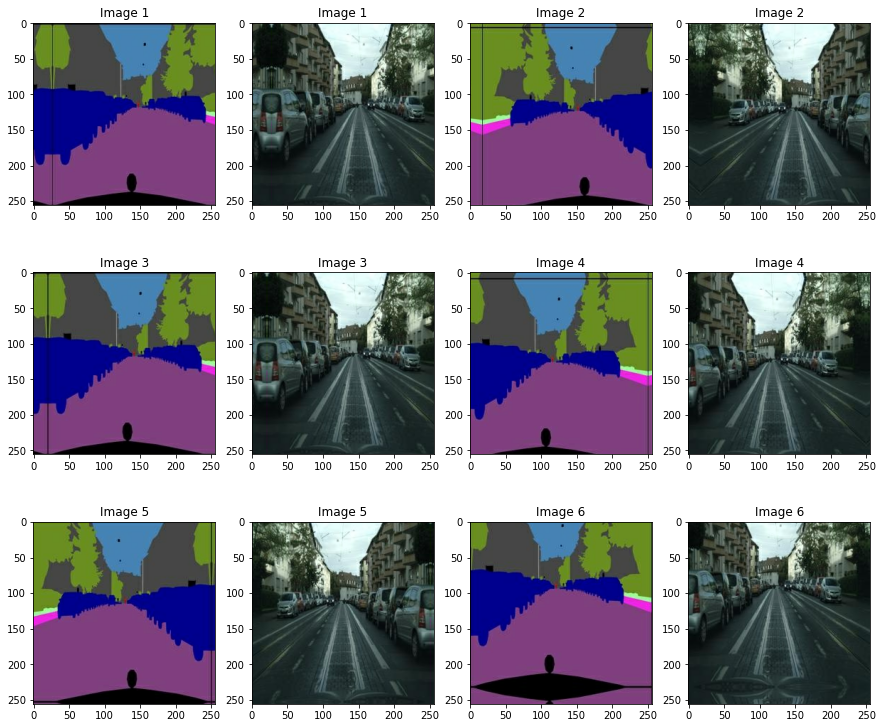

In [7]:
# 결과 확인

plt.figure(figsize=(15,13))
img_n = 1
for i in range(1, 13, 2):
    augmented_seg, augmented_real_img = apply_augmentation(seg, real_img)
    
    plt.subplot(3,4,i)
    plt.imshow(denormalize(augmented_seg)); plt.title(f"Image {img_n}")
    plt.subplot(3,4,i+1); 
    plt.imshow(denormalize(augmented_real_img)); plt.title(f"Image {img_n}")
    img_n += 1

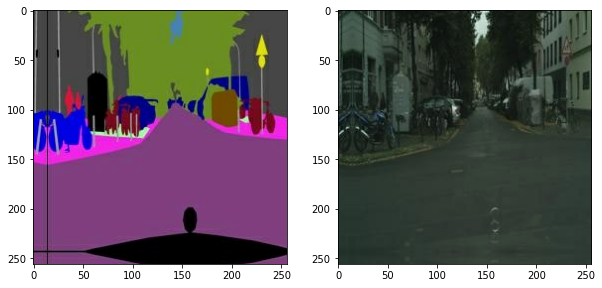

In [8]:
# 학습데이터에 적용

from tensorflow import data

def get_train(img_path):
    seg, real_img = load_img(img_path)
    seg, real_img = apply_augmentation(seg, real_img)
    return seg, real_img

train_images = data.Dataset.list_files(data_path + "*.jpg")
train_images = train_images.map(get_train).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

sample = train_images.take(1)
sample = list(sample.as_numpy_iterator())
seg, real_img = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(seg[0].astype(np.uint8))
plt.subplot(1,2,2); plt.imshow(real_img[0].astype(np.uint8))

## Generator 구현하기

In [9]:
from tensorflow.keras import layers, Input, Model

class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization(momentum=MOMENTUM)
        self.lrelu = layers.LeakyReLU(ALPHA)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

    
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization(momentum=MOMENTUM)
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(DROPOUT)(x)
        return self.relu(x)

In [10]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1]
                    
        for block, feat in zip(self.decode_blocks, features[::-1]):
            x = block(x)
            x = layers.Concatenate()([x, feat])
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()
    
UNetGenerator().get_summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
encode_block (EncodeBlock)      (None, 128, 128, 64) 3072        input_1[0][0]                    
__________________________________________________________________________________________________
encode_block_1 (EncodeBlock)    (None, 64, 64, 128)  131584      encode_block[0][0]               
__________________________________________________________________________________________________
encode_block_2 (EncodeBlock)    (None, 32, 32, 256)  525312      encode_block_1[0][0]             
______________________________________________________________________________________________

## Discriminator 구성하기

In [11]:
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        self.batchnorm = layers.BatchNormalization(momentum=MOMENTUM) if use_bn else None
        self.lrelu = layers.LeakyReLU(ALPHA) if act else None
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x 

In [12]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")
        
        # filters = [64,128,256,512,1]
        # self.blocks = [layers.Concatenate()]
        # for i, f in enumerate(filters):
        #     self.blocks.append(DiscBlock(
        #         n_filters=f,
        #         strides=2 if i<3 else 1,
        #         custom_pad=False if i<3 else True,
        #         use_bn=False if i==0 and i==4 else True,
        #         act=True if i<4 else False
        #     ))
    
    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()
    
Discriminator().get_summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
concatenate_7 (Concatenate)     (None, 256, 256, 6)  0           input_2[0][0]                    
                                                                 input_3[0][0]                    
__________________________________________________________________________________________________
disc_block (DiscBlock)          (None, 128, 128, 64) 6144        concatenate_7[0][0]        

## 학습 및 테스트하기

In [13]:
# 손실함수

from tensorflow.keras import losses

bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc): # Generator의 손실함수
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc): # Discriminator의 손실함수
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)


In [14]:
# optimizer

from tensorflow.keras import optimizers

gene_opt = optimizers.Adam(G_init, BETA_1, BETA_2, decay=DECAY)
disc_opt = optimizers.Adam(D_init, BETA_1, BETA_2, decay=DECAY)

In [15]:
# L1 loss를 포함한 업데이트 과정

generator = UNetGenerator()
discriminator = Discriminator()

@tf.function
def train_step(seg, real_img):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_img = generator(seg, training=True)
        # Discriminator 예측
        fake_disc = discriminator(seg, fake_img, training=True)
        real_disc = discriminator(seg, real_img, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_img, real_img, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

# 체크포인트 모듈 설정

``` python
generator = UNetGenerator()
discriminator = Discriminator()

checkpoint_dir = os.getenv('HOME')+'aiffel/cGAN/cityscapes/training_checkpoints'

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=gene_opt,
                                 discriminator_optimizer=disc_opt,
                                 generator=generator,
                                 discriminator=discriminator)
```

## 이미지 시각화 함수

test에 사용하지 않는 val 이미지를 seed로 삼아서 중간중간 이미지 확인

In [16]:
# seed_dataset 이미지 설정
from IPython import display

test_path = os.getenv('HOME')+'/aiffel/cGAN/cityscapes/val/'

def generate_and_save_images(model, epoch, it): 
    fig = plt.figure(figsize=(6, 4))
    for i in range(5):
        f = test_path + os.listdir(test_path)[i]
        seed, _ = load_img(f)
        pred = generator(tf.expand_dims(seed, 0), training=False)
        pred = denormalize(pred)
        
        plt.subplot(2,3,i+1)
        plt.imshow(pred[0])
        plt.axis('off')
    plt.savefig('{}/aiffel/cGAN/cityscapes/generated_samples/sample_epoch_{:04d}_iter_{:03d}.png'
                    .format(os.getenv('HOME'), epoch, it))
    plt.show()

## cGAN으로 학습하기 - test

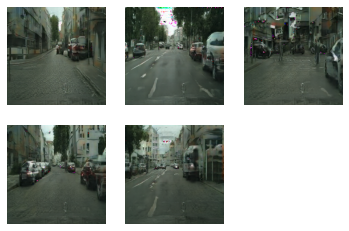

EPOCH[400] - STEP[100]                     
Generator_loss:1.7849                     
L1_loss:0.1399                     
Discriminator_loss:0.4836


In [17]:
history = {'Epoch-STEP':[], 'G_loss':[], 'L1_loss':[], 'D_loss':[]}

for epoch in range(1, EPOCHS+1):
    for i, (se, img) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(se, img)
        
            
        # save_every회 반복마다 손실을 출력합니다.
        if (i+1) % save_every == 0:
            display.clear_output(wait=True)
            generate_and_save_images(generator, epoch+1, i+1)
            
            history['Epoch-STEP'].append(f'{epoch} - {i+1:03d}')
            history['G_loss'].append(f'{g_loss.numpy():.4f}')
            history['L1_loss'].append(f'{l1_loss.numpy():.4f}')
            history['D_loss'].append(f'{d_loss.numpy():.4f}')
            
            print(f"EPOCH[{epoch}] - STEP[{i+1:3d}] \
                    \nGenerator_loss:{g_loss.numpy():.4f} \
                    \nL1_loss:{l1_loss.numpy():.4f} \
                    \nDiscriminator_loss:{d_loss.numpy():.4f}")
            
    #if (epoch + 1) % save_every == 0:
    #        checkpoint.save(file_prefix=checkpoint_prefix)


In [18]:
import pandas as pd
pd.set_option('display.max_row', None) # 모든 행 출력
df = pd.DataFrame(history)
df

,Epoch-STEP,G_loss,L1_loss,D_loss
0,1 - 050,0.6659,0.1731,1.4094
1,1 - 100,0.6925,0.1778,1.6488
2,2 - 050,0.8035,0.1454,1.3248
3,2 - 100,1.0992,0.1750,1.0592
4,3 - 050,0.9206,0.1768,1.1080
5,3 - 100,0.8281,0.1615,1.2695
6,4 - 050,1.5085,0.1723,0.8463
7,4 - 100,1.4638,0.1799,1.1026
8,5 - 050,0.7289,0.1851,1.6232
9,5 - 100,0.7833,0.1696,1.0160


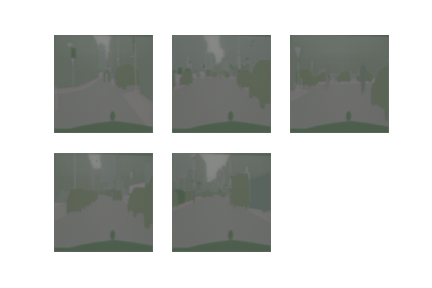

In [19]:
from IPython.display import Image
import imageio
import glob

anim_file = os.getenv('HOME')+'/aiffel/cGAN/cityscapes/cityscapes4.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('{}/aiffel/cGAN/cityscapes/generated_samples/sample*.png'.format(os.getenv('HOME')))
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

Image(os.getenv('HOME')+'/aiffel/cGAN/cityscapes/cityscapes4.gif')

![](https://images.velog.io/images/yvelog/post/40a6a026-469d-4313-afa8-71ab7e8ca827/cityscapes4.gif)

## test

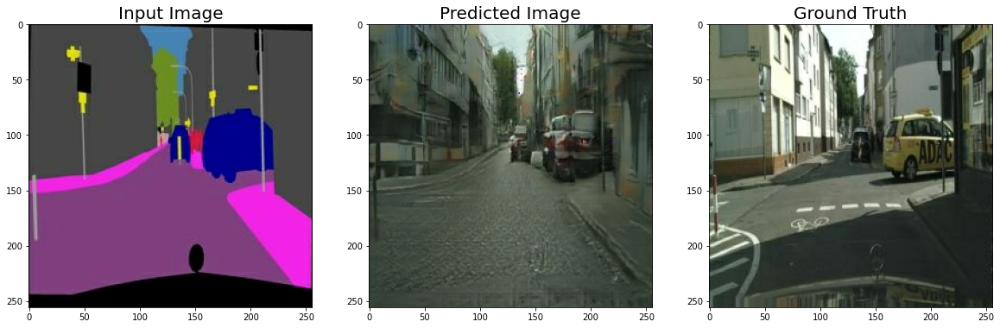

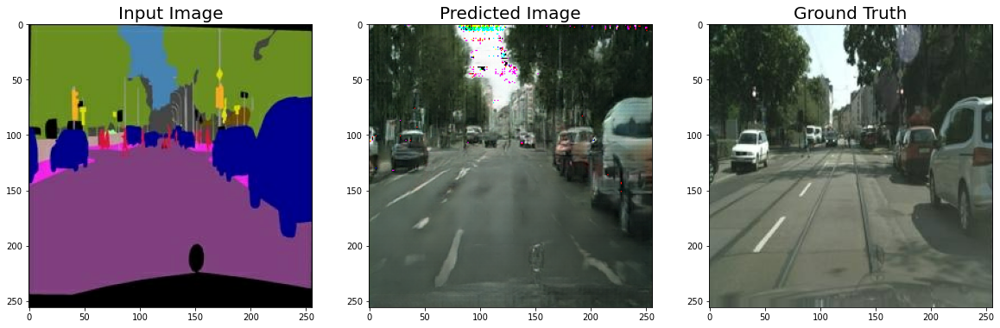

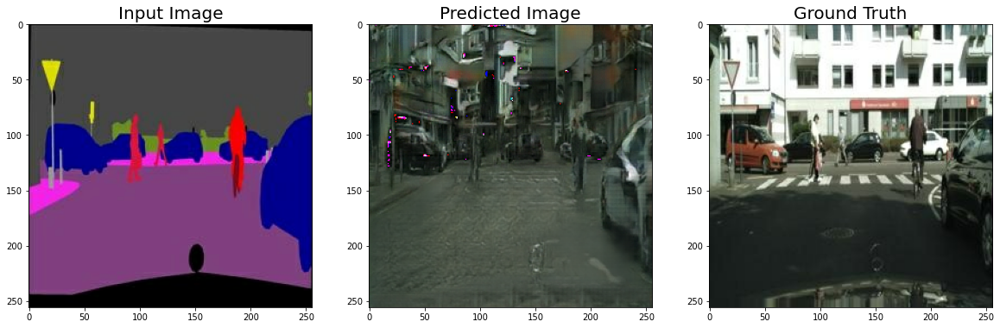

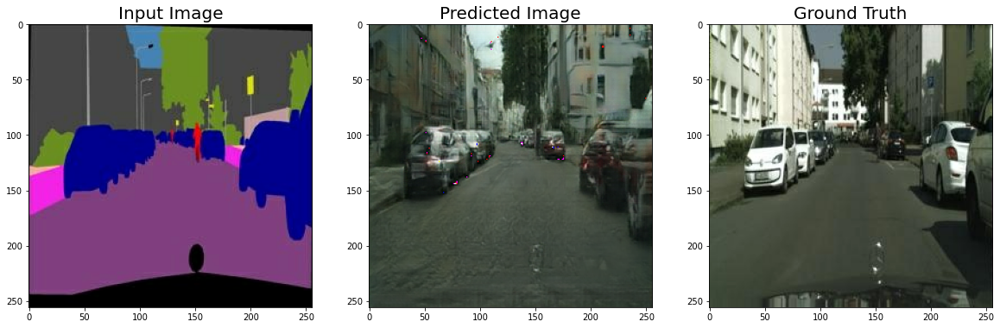

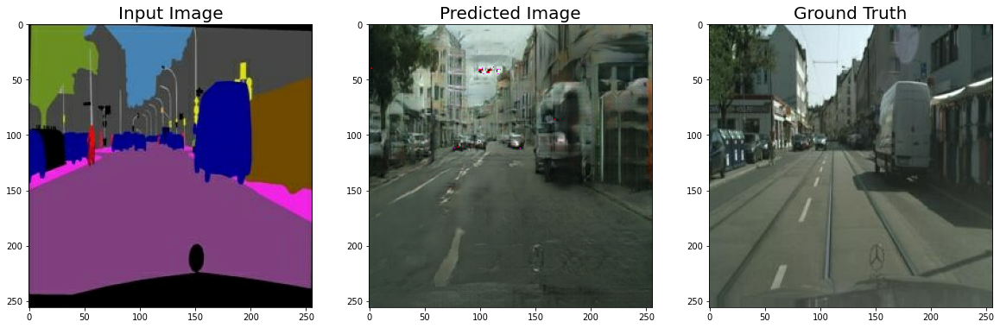

In [20]:
test_path = os.getenv('HOME')+'/aiffel/cGAN/cityscapes/val/'

for i in range(5):
    f = test_path + os.listdir(test_path)[i]
    seg, real_img = load_img(f)

    pred = generator(tf.expand_dims(seg, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(20,10))
    plt.subplot(1,3,1); plt.imshow(denormalize(seg)); plt.title('Input Image', fontsize=20)
    plt.subplot(1,3,2); plt.imshow(pred[0]); plt.title('Predicted Image', fontsize=20)
    plt.subplot(1,3,3); plt.imshow(denormalize(real_img)); plt.title('Ground Truth', fontsize=20)

## 체크포인트 로드하기

```python
latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator
```

# 회고

- 일단 체크포인트가 왜 저장이 안 되는지 모르겠다... 코드는 맞게 쓴 것 같은데
- 소박하게 오백번 정도만 돌리고 싶었는데 커널이 계속 튕기는 현상이 발생 ㅠㅠ
- 학습 중에 쌓이는 데이터가 컨테이너에 무리가 되나 싶어서, 사백번으로 조절.
- 하도 튕겨대가지고 하이퍼파라미터 조정은 시도를 못했다 ㅠㅠ
- 그렇다고 잠깐만 돌리자니 하이퍼파라미터 조절의 효과를 알아볼 수도 없고..
- 그래서 그냥 적당히 한번 써봤던 값으로 한번만 돌리고 마감..
---
- 만들어진 이미지를 보면, 표지판이나 신호등, 사람 같이
- 비교적 작고 등장 횟수가 적은 물체는 제대로 형성하지 못하는 걸 알 수 있다
- 대충 색이 다르니 뭔가 있기는 있겠지 하는 느낌으로 형체는 잡는데
- 구체적인 형상은 만들지 못하고 있는 것으로 보야 학습량이 많이 부족한 상태이다.
- 테스트 이미지를 시드 값으로 삼아서 중간중간 결과를 확인해봤는데,
- 가장 신경을 썼던 이미지는 3번째인 하늘이 없는 이미지였다.
- 정면이 건물로 막혀있는데 학습 초기에는
- 해당 건물이 삼등분되어서 똑같은 형태로 움직여서 걱정스러웠지만
- 학습이 쌓이면서 적당히 다른 모습으로 정리되었다.
- 사람이 유령같이 등장한 건 어쩔 수 없지만 꽤 선명한 표지판이 안 잡히는건 의외였다.
- 역시 등장 빈도가 낮아서 학습량이 모자란 것 같다는 결론..